In [9]:
import PIL
import numpy as np
import matplotlib.pyplot as plt
import vtk
from vtk.util.numpy_support import vtk_to_numpy
from tqdm import tqdm
from scipy.optimize import minimize
from vedo import *
import meshio
import seaborn as sns
import pyvista as pv
from data_processing.mesh_to_array import *
import pandas as pd
from matplotlib.colors import LinearSegmentedColormap
import hydra
from hydra import compose, initialize
from omegaconf import OmegaConf, DictConfig
import fnmatch
import torch
from train.testing import testing
from data_processing.dataset import load_dataset
from utils.helper import make_cmap
cmap = make_cmap()

def get_all_cases(cfg: DictConfig, base_dir=".."):
    if cfg.data.cases == 'all':
        cases = os.listdir(os.path.join(base_dir,cfg.data.processed_data_folder))
        cases = [case.split('.')[0] for case in cases if fnmatch.fnmatch(case, 'case_TCIA*')]
        cases_number = [int(case.split('_')[-2]) for case in cases]
        # cases = [case for case, case_number in zip(cases, cases_number) if case_number < 290]
        # cases 
    else:
        cases = cfg.data.cases
    return cases




# Load model and process test data

In [10]:
with initialize(version_base=None, config_path="cfg", job_name="test"):
    cfg = compose(config_name="config")


In [11]:
cases = get_all_cases(cfg, base_dir='')    
train_dataset, test_dataset, val_datset = load_dataset(cases,
                resolution=cfg.data.resolution, 
                electrode_resolution=cfg.data.electrode_resolution,
                mask_resolution=cfg.data.mask_resolution, 
                base_dir = '',
                raw_data_folder=cfg.data.raw_data_folder, 
                processed_data_folder=cfg.data.processed_data_folder,
                dataset_data_folder=cfg.data.dataset_data_folder,
                no_weights=cfg.data.no_weights, name_prefix=cfg.data.name_prefix,
                write_dataset=cfg.data.write_dataset, write_npz=cfg.data.write_npz, 
                overwrite_npz=cfg.data.overwrite_npz, n_sample_points=cfg.learning.training.sample_points,
                return_electrodes=cfg.data.return_electrodes)

100%|██████████| 172/172 [00:25<00:00,  6.75it/s]


Training set: 2192, validation set: 272, test set: 288


In [12]:
# run = wandb.init(project=cfg.wandb.project, 
#                     config=OmegaConf.to_container(cfg, resolve=True, throw_on_missing=True))
model = hydra.utils.instantiate(cfg.learning.model, mask_resolution=cfg.data.mask_resolution, no_weights=cfg.data.no_weights)


In [13]:
model.load_state_dict(torch.load(os.path.join(cfg.inference_path,'model.pt'), map_location=cfg.learning.training.device))
targets, preds = testing(model, test_dataset, batch_size=cfg.learning.testing.batch_size_test, device=cfg.learning.training.device, wandb_log=False)


Test Loss:  tensor(0.0113, device='cuda:0')


In [42]:
e

tensor([[[[ 0.0000, -0.4492],
          [ 0.3125, -0.4961],
          [ 0.6172, -0.4570],
          ...,
          [-0.8359, -0.0703],
          [-0.6914, -0.3945],
          [-0.3984, -0.4844]],

         [[-0.0117, -0.4961],
          [ 0.2852, -0.5586],
          [ 0.6211, -0.5039],
          ...,
          [-0.8477, -0.1484],
          [-0.6797, -0.4492],
          [-0.3594, -0.5586]],

         [[ 0.0703, -0.5430],
          [ 0.3711, -0.5078],
          [ 0.5898, -0.3945],
          ...,
          [-0.7539, -0.1289],
          [-0.5586, -0.4062],
          [-0.2617, -0.5312]],

         ...,

         [[-0.0117, -0.4961],
          [ 0.2852, -0.5586],
          [ 0.6211, -0.5039],
          ...,
          [-0.8477, -0.1484],
          [-0.6797, -0.4492],
          [-0.3594, -0.5586]],

         [[ 0.0703, -0.5430],
          [ 0.3711, -0.5078],
          [ 0.5898, -0.3945],
          ...,
          [-0.7539, -0.1289],
          [-0.5586, -0.4062],
          [-0.2617, -0.5312]],



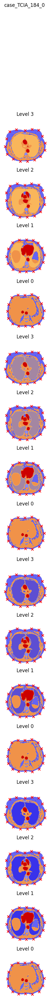

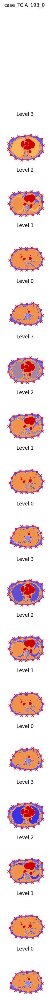

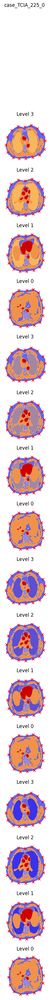

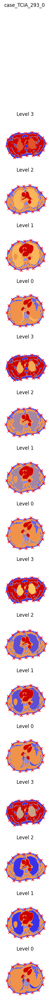

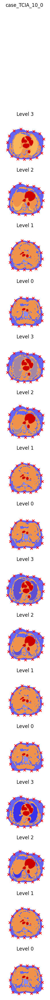

...

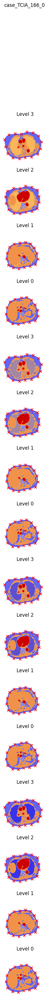

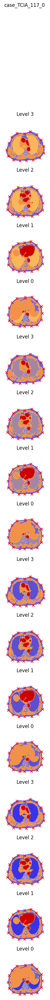

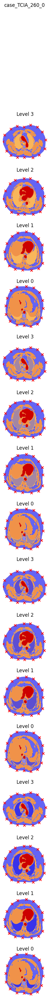

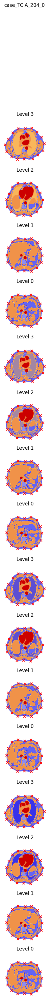

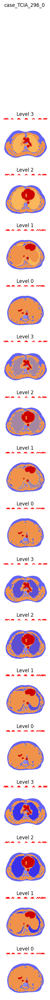

IndexError: index 17 is out of bounds for dimension 0 with size 17

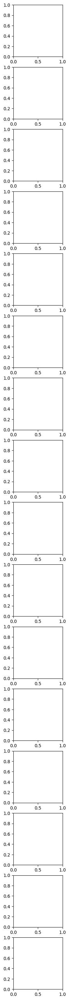

In [43]:
# images
t = test_dataset.targets.reshape(-1, 4, 4, 512, 512)
t = t.moveaxis(2, 1)
t = t.reshape(-1, 16, 512, 512)
# level
l = test_dataset.levels.reshape(-1, 4, 4).moveaxis(2,1).reshape(-1, 16)
# electrodes
e = test_dataset.electrodes.reshape(-1, 4, 4, 16, 3).moveaxis(2, 1).reshape(-1, 16, 16, 3)
e = (e[:, :, :, :2] + 1) * 256

for i in range(preds_case.shape[0]):
    fig, axes = plt.subplots(16, 1, figsize=(2, 40))
    for resistancy in range(16):
        axes[resistancy].set_title(f'Level {str(l[i,resistancy].numpy())}')
        axes[resistancy].imshow(t[i,resistancy], cmap=cmap)
        axes[resistancy].scatter(e[i,resistancy,:,0], e[i,resistancy,:,1], marker='x', c='r')
        axes[resistancy].axis('off')
    # Add colorbar to the figure
    fig.suptitle(f'{test_dataset.cases[i]}', fontsize=12)
    plt.show()
    plt.close(fig)
    if i == 20:
        break

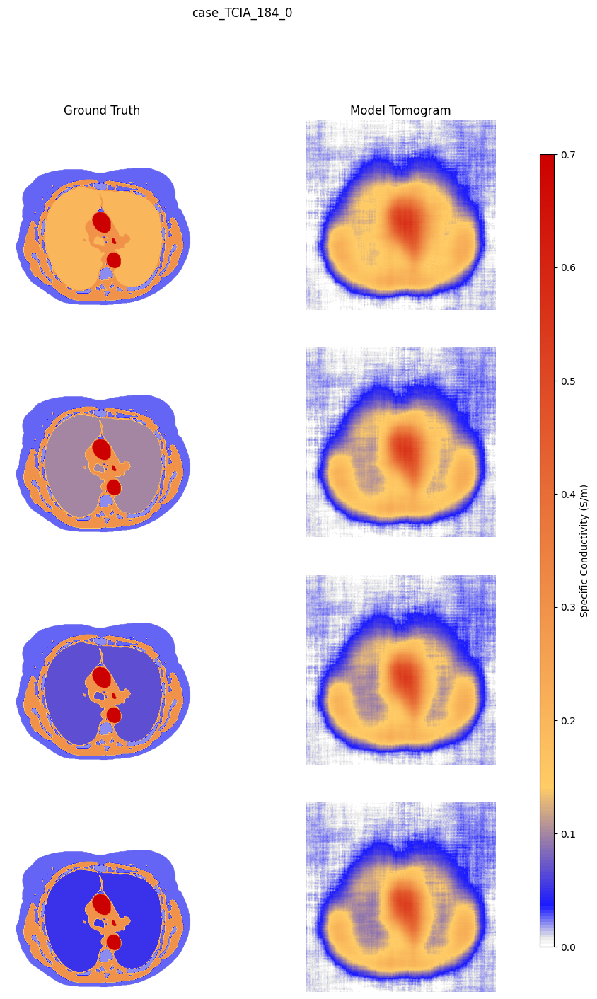

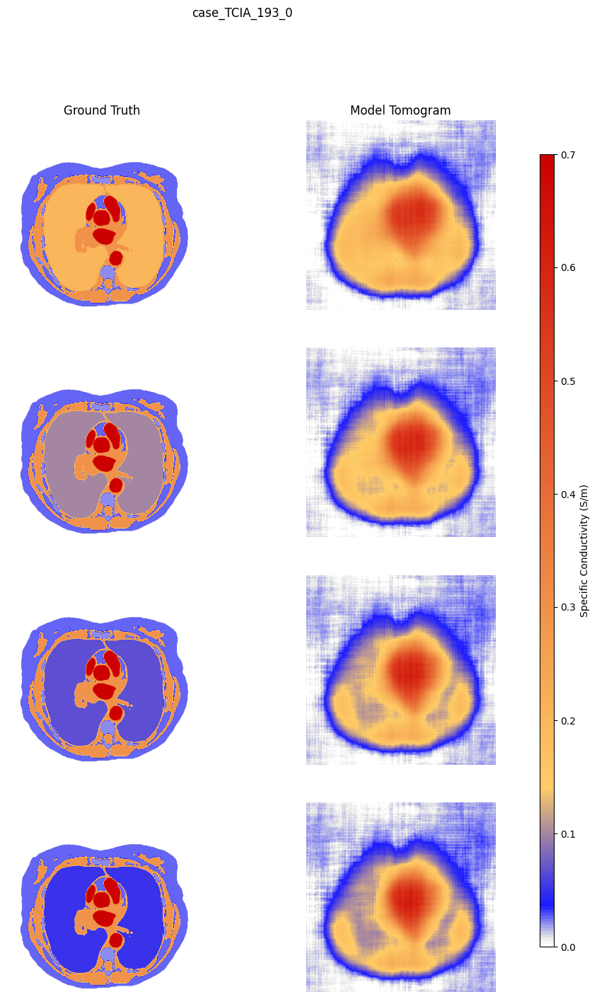

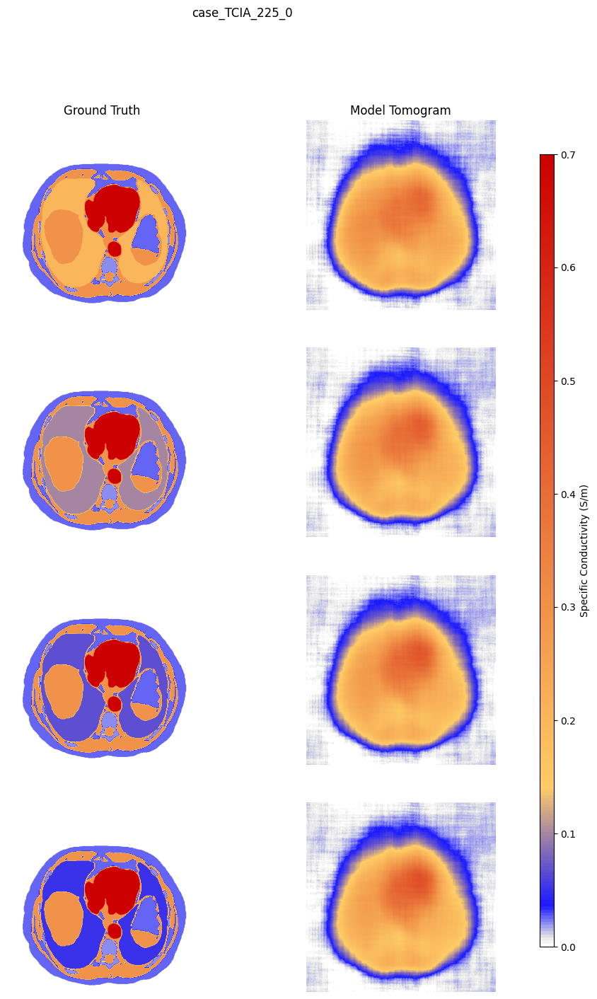

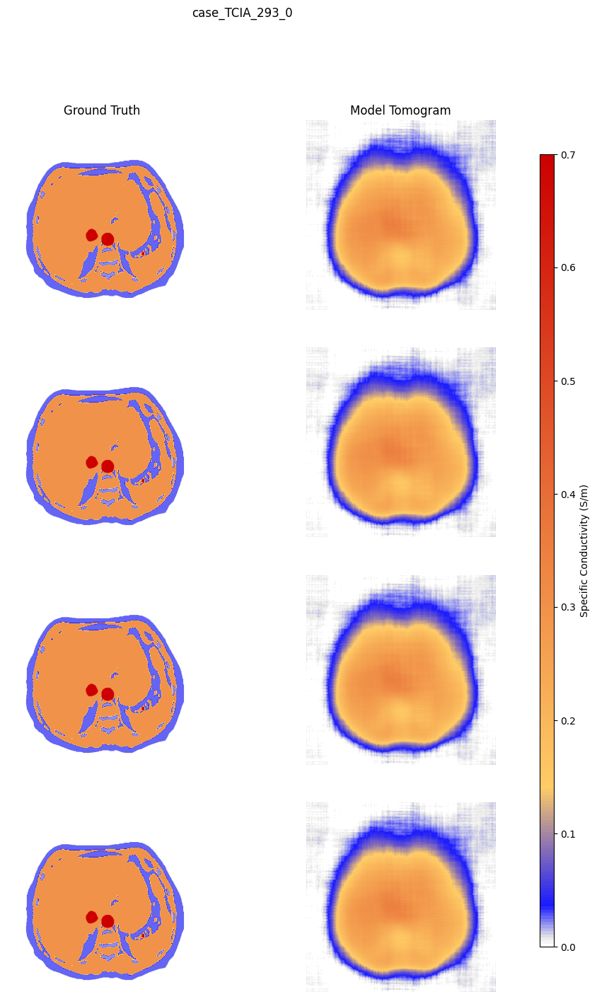

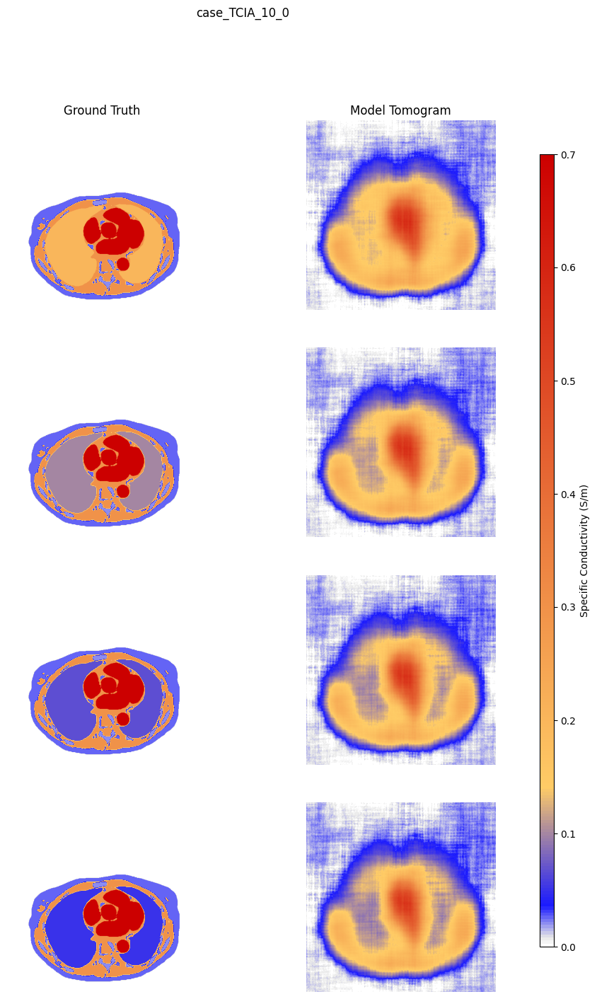

...

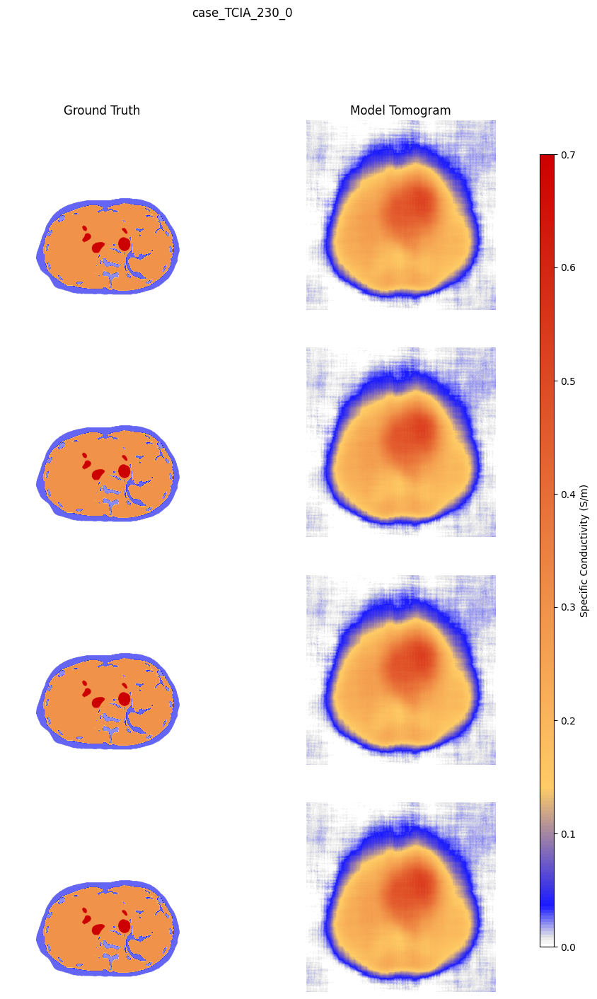

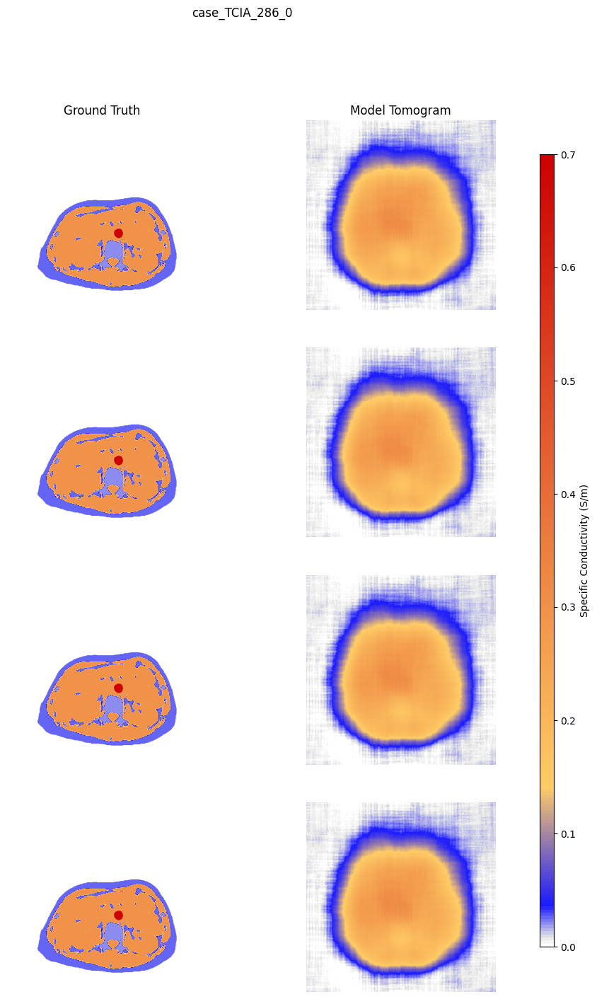

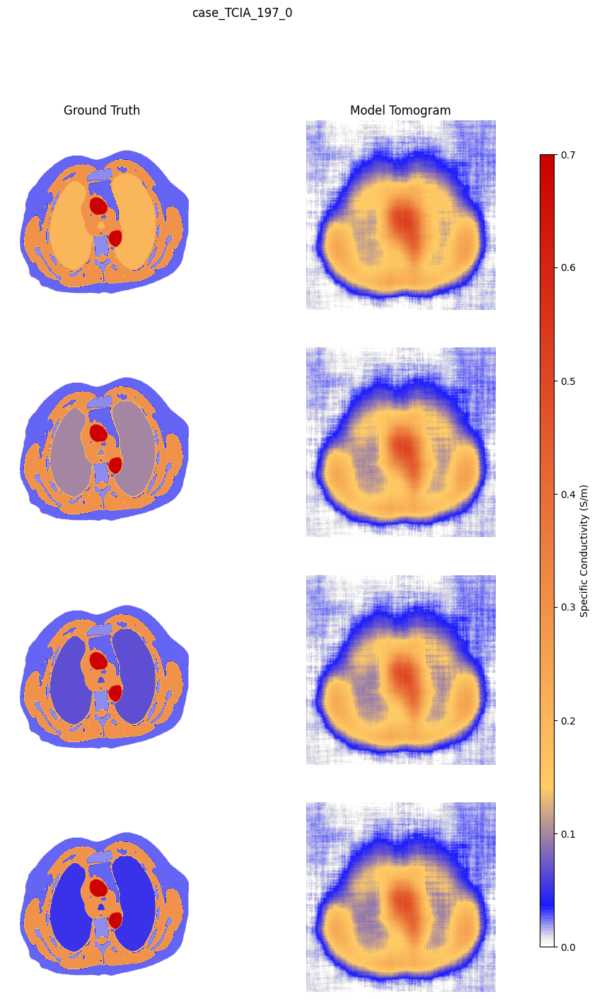

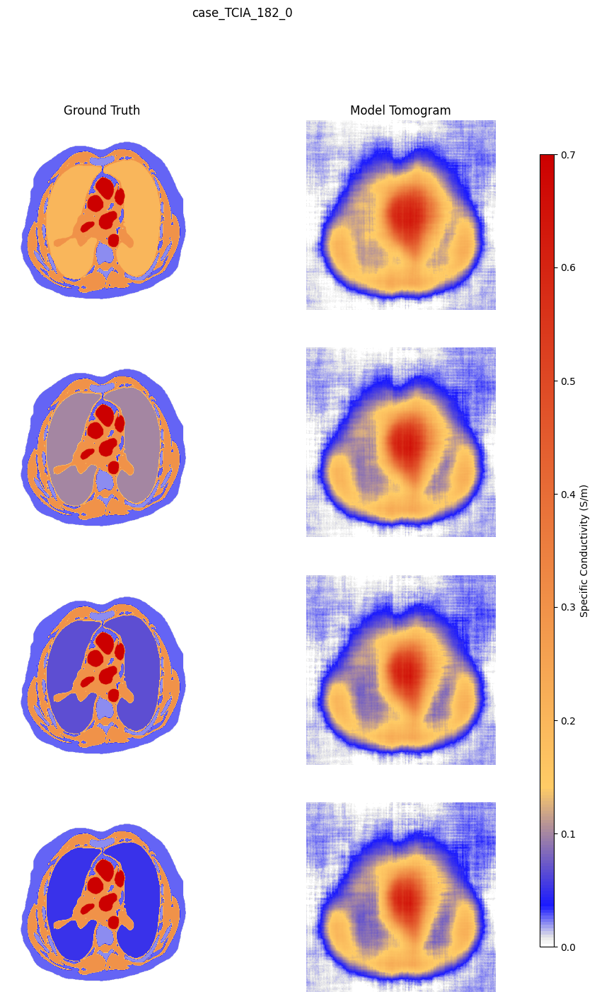

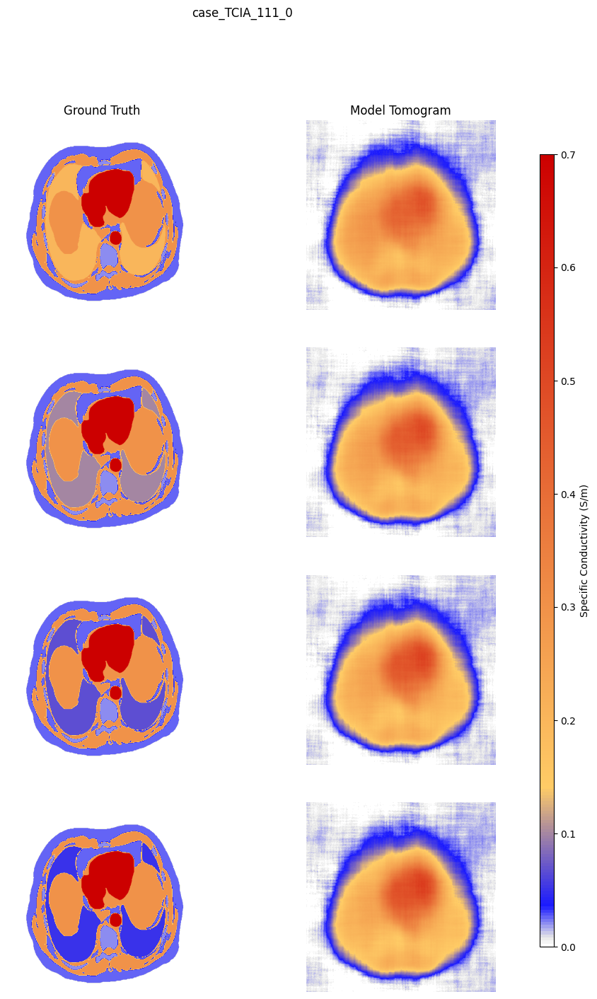

In [17]:
targets_case = targets.detach().cpu().numpy().squeeze().reshape(-1, 4, 512, 512)
preds_case = preds.detach().cpu().numpy().squeeze().reshape(-1, 4, 512, 512)
for i in range(preds_case.shape[0]):
    fig, axes = plt.subplots(4, 2, figsize=(10, 16))
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # [left, bottom, width, height]
    for resistancy in range(4):
        if resistancy == 0:
            axes[resistancy,0].set_title('Ground Truth')
            axes[resistancy,1].set_title('Model Tomogram')
        axes[resistancy,0].imshow(targets_case[i,resistancy], vmin=0, vmax=0.7, cmap=cmap)
        axes[resistancy,0].axis('off')
        axes[resistancy,1].imshow(preds_case[i,resistancy], vmin=0, vmax=0.7, cmap=cmap)
        axes[resistancy,1].axis('off')
    # Add colorbar to the figure
    sm = plt.cm.ScalarMappable(cmap=cmap)
    sm.set_clim(0, 0.7)
    cbar = fig.colorbar(sm, cax=cbar_ax)        
    cbar.set_label('Specific Conductivity (S/m)')
    fig.suptitle(f'{test_dataset.cases[i]}', fontsize=12)
    plt.show()
    plt.close(fig)
    if i == 10:
        break
